In [1]:
import numpy as np
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = (4, 3)
plt.rcParams['font.size'] = 8
plt.rcParams["figure.autolayout"] = True # same as tight_layout after every plot
from interface_1d import swi_simulate, swi_simulate_steady

In [33]:
# parameters
k = 10 # horizontal hydraulic conductivity, m/d
S = 0.2 # storage coefficient, -
Se = 1e-4 # specific storage coef, m^(-1)
zt = 10 # top aquifer, m
zb = -50 # aquifer bottom, m
rhof = 1000 # freshwater density, kg/m3
rhos = 1025 # saltwater density, kg/m3
hsea = 0 # head in sea

# grid
L = 2000 # length of aquifer, m
ncol = 41 #41 # number of columns
#ncol = 11

# bc
hleft = 0 # head on left side, m
Qleft = 0.4
Qf = np.zeros(ncol) # array with source terms
Qf[-1] = Qleft

# initial conditions
hf0 = 0 # freshwater head in freshwater, m
zeta0 = 0 # interface, m

# time step
#delt = 4000 # time step, d
#delt = 100 # time step, d
#nstep = 20 # number of time steps
delt = 400
nstep = 200
perlen = delt * nstep

# computed parameters
delx = L / (ncol - 1) # cell size, m
xg = np.linspace(0, L, ncol) # grid coordinates, m
fixed = np.nan * np.ones(ncol) # array with fixed head values
fixed[0] = hleft
ghb = None

Qs = np.zeros(ncol)
hfini = hf0 * np.ones(ncol) # array with initial freshwater head
zetaini = zeta0 * np.ones(ncol) # array with initial saltwater head

In [34]:
hfsteady1, zetasteady1, _ = swi_simulate_steady(hfini, k, 0, 0, zb, zt, Qf, Qs, fixed, ghb, rhof, rhos, delx, hsea, perlen, 1, tmultiply=1)

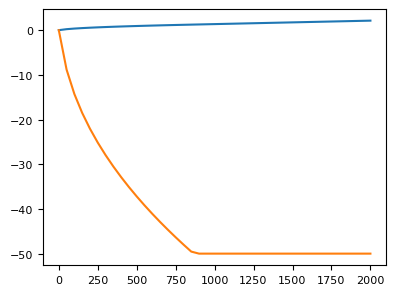

In [35]:
plt.plot(xg, hfsteady1[1])
plt.plot(xg, zetasteady1[1])

In [36]:
hf1, hs1, zeta1, _ = swi_simulate(hfini, zetaini, k, S, Se, zb, zt, Qf, Qs, fixed, 
                                         ghb, rhof, rhos, delx, perlen, nstep, tmultiply=1)

In [37]:
Qf[-1] = 0.5 * Qleft
hf1, hs1, zeta1, _ = swi_simulate(hfsteady1[-1], zetasteady1[-1], k, S, Se, zb, zt, Qf, Qs, fixed, 
                                         ghb, rhof, rhos, delx, perlen, nstep, tmultiply=1)

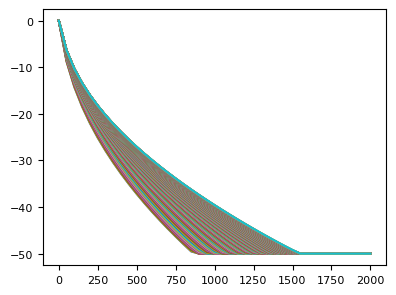

In [38]:
for i in range(nstep):
    plt.plot(xg, zeta1[i])

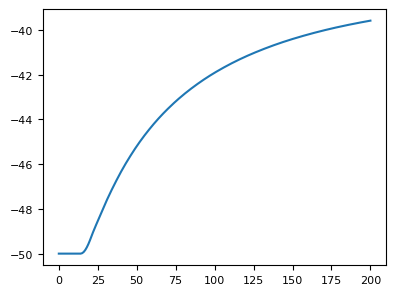

In [39]:
plt.plot(zeta1[:, 20])

In [40]:
Qf[-1] = Qleft
hf2, hs2, zeta2, _  = swi_simulate(hf1[-1], zeta1[-1], k, S, Se, zb, zt, Qf, Qs, fixed, 
                                   ghb, rhof, rhos, delx, perlen, nstep, tmultiply=1)

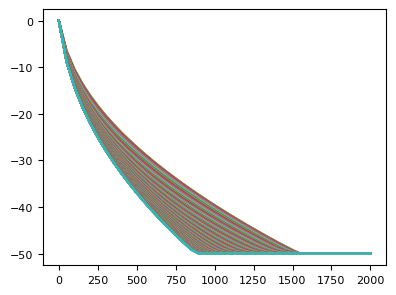

In [41]:
for i in range(nstep):
    plt.plot(xg, zeta2[i])

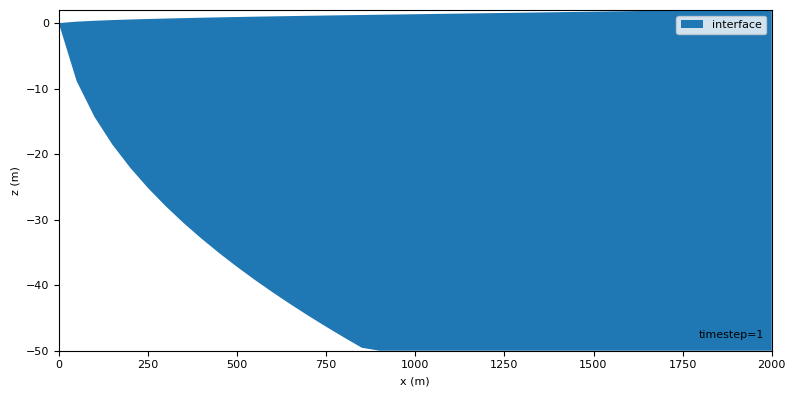

In [42]:
import matplotlib.animation as animation
from IPython.display import HTML
from IPython.display import display

zeta = np.vstack((zeta1, zeta2[1:]))
head = np.vstack((hf1, hf2[1:]))
fig = plt.figure(figsize=(8, 4))
ax = plt.subplot(111)
fill = ax.fill_between(xg, zeta[0], head[0], label='interface')
text = ax.text(1980, -48, f'timestep={1}', ha='right')
ax.set(xlim=[0, 2000], ylim=[zb, 2], xlabel='x (m)', ylabel='z (m)')
ax.legend(loc='upper right')

def update(frame):
    dummy = ax.fill_between(xg, zeta[frame], head[frame])
    dp = dummy.get_paths()[0]
    dummy.remove()
    #update the vertices of the PolyCollection
    fill.set_paths([dp.vertices])
    text.set_text(f'timestep={frame}')
    #line.set_ydata(zeta[frame])
    if frame < nstep:
        ax.set_title('Reduce flow to coast', fontdict={'color':'C0'})
    else:
        ax.set_title('Increase flow to coast', fontdict={'color':'C1'})
    return (fill, text)

In [43]:
# import matplotlib.animation as animation
# from IPython.display import HTML
# from IPython.display import display

# hf = np.vstack((hf1, hf2[1:]))
# zeta = np.vstack((zeta1, zeta2[1:]))
# fig, ax = plt.subplots()
# line1 = ax.plot(xg, hf[0], label='water table')[0]
# line2 = ax.plot(xg, zeta[0], label='interface')[0]
# ax.set(xlim=[0, 2000], ylim=[zb, 2], xlabel='x (m)', ylabel='z (m)')
# ax.legend(loc='upper right')


# def update(frame):
#     line1.set_ydata(hf[frame])
#     line2.set_ydata(zeta[frame])
#     if frame < nstep:
#         ax.set_title('Reduce flow to coast', fontdict={'color':'C0'})
#     else:
#         ax.set_title('Increase flow to coast', fontdict={'color':'C1'})
#     return (line1, line2)

In [44]:
ani = animation.FuncAnimation(fig=fig, func=update, frames=len(zeta), interval=50)
display(HTML(ani.to_jshtml()))
#ani.save('zeta2.gif')

MovieWriter ffmpeg unavailable; using Pillow instead.


In [ ]:
# simulation steady salt

In [32]:
Qf[-1] = Qleft
hfsteady3, zetasteady3, _ = swi_simulate_steady(hfsteady2[-1], k, S, Se, zb, Qf, Qs, fixed, ghb, rhof, rhos, delx, hsea, perlen, nstep, tmultiply=1)

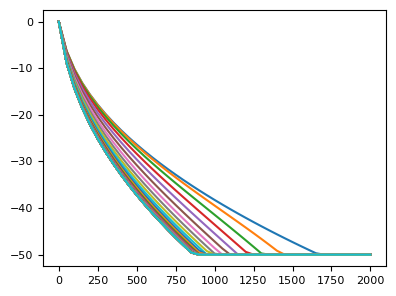

In [33]:
for i in range(nstep):
    plt.plot(xg, zetasteady3[i])